# 0.0 Imports and directories

In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import os
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [2]:
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
DATA_DIR = os.path.join(BASE_DIR, 'feature_eng', 'data')

# 1.0 EDA

In [3]:
df = pd.read_csv(os.path.join(DATA_DIR, 'ft_df.csv'))
full_df = pd.read_csv(os.path.join(DATA_DIR, 'full_df.csv'))

In [4]:
df = df.dropna()

## 1.1 Univariate Analysis

What do we want to look at in this pandas profile?
1.  Variables with a disperse distribution (won't suit this data since it's an ecommerce dataset)
2. Metrics:
    - Min, Max, Range (dispersion)
    - Mean vs Median
    - Std and variance
    - var coef.

In [5]:
profile = ProfileReport(df)
#profile.to_file('output.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 1.1.1 Avg Basket Size

In [6]:
df[df.avg_basket_size == 40498.5]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket


In [7]:
full_df[full_df.customer_id == 16446]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id


### 1.1.2 Qt items

In [8]:
df[df.qt_items == 196844]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket
1017,14646,7.844444,2733.944444,9.708333,279138.02,288.0,1.0,72.0,2060.0,196844.0,0.20339,3876.916944


In [9]:
full_df[full_df.customer_id == 14646].head(30)

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
37613,539491,21981,12,2016-12-18,0.29,Netherlands,14646
37614,539491,21986,12,2016-12-18,0.29,Netherlands,14646
37615,539491,22720,2,2016-12-18,4.95,Netherlands,14646
37616,539491,21931,1,2016-12-18,1.95,Netherlands,14646
37617,539491,22613,2,2016-12-18,0.85,Netherlands,14646
37618,539491,20751,1,2016-12-18,2.10,Netherlands,14646
37619,539491,21246,2,2016-12-18,4.95,Netherlands,14646
37620,539491,22960,1,2016-12-18,4.25,Netherlands,14646
37621,539491,22355,2,2016-12-18,0.85,Netherlands,14646
37622,539491,21123,2,2016-12-18,1.25,Netherlands,14646


### 1.1.3 frequency

In [10]:
df[df.frequency == 17]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket
0,17850,35.5,50.970588,0.617647,5391.21,40.0,372.0,34.0,297.0,1733.0,17.0,158.565


In [11]:
full_df[full_df.customer_id == 17850].invoice_date.value_counts()

2016-11-30    213
2016-11-29     84
2017-02-08     15
Name: invoice_date, dtype: int64

### 1.1.4 average_ticket

In [12]:
df[df.average_ticket == 84236.25]

,customer_id,avg_recency_days,avg_basket_size,avg_unique_basket_size,gross_revenue,qt_returns,last_purchase,orders,qt_products,qt_items,frequency,average_ticket


In [13]:
full_df[full_df.customer_id == 16446]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id


## 1.2 Bivariate Analysis

<Figure size 7200x2880 with 0 Axes>

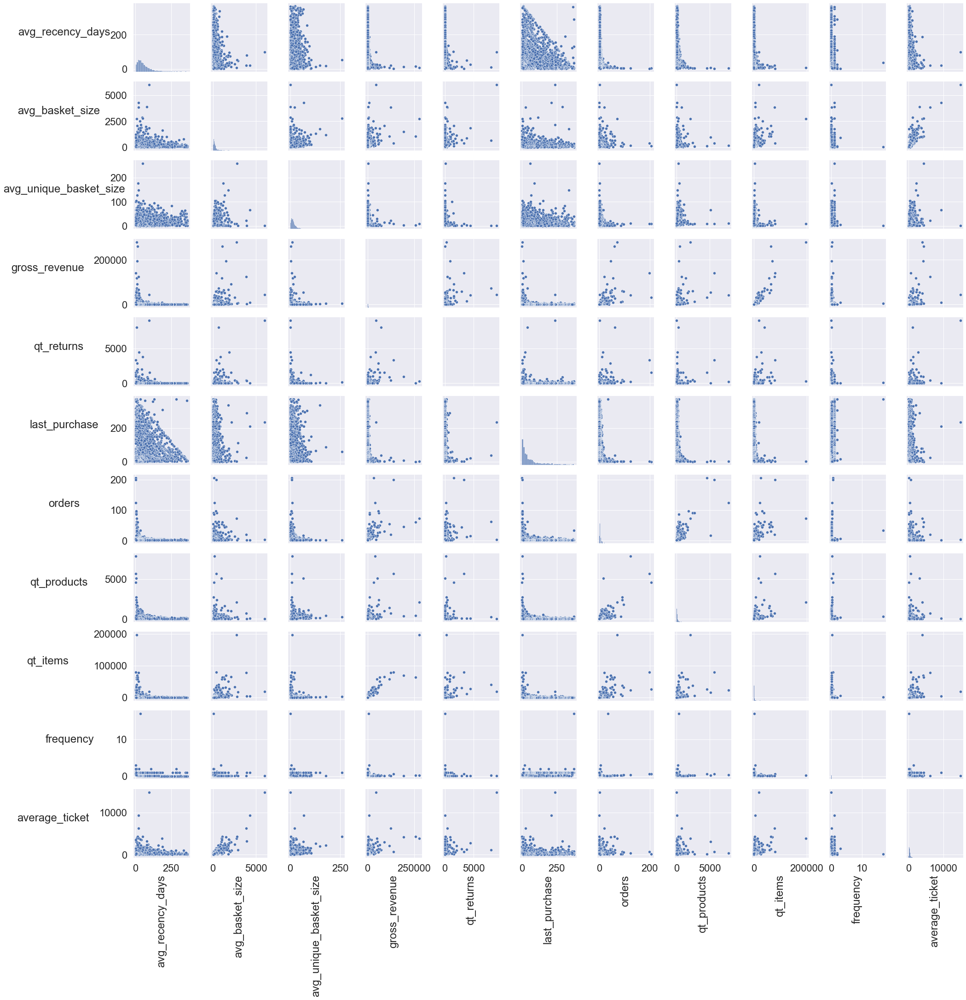

In [14]:
plot_df = df.drop(columns = 'customer_id')

plt.figure( figsize=(100, 40) )
sns.set(font_scale = 2)

g = sns.pairplot(plot_df)

for ax in g.axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.labelpad = 100

In [15]:
sns.set()

**Notes**
1. Frequency has low variance
2. Avg ticket has low variance

## 1.3 Space study

In [16]:
cols_selected = ['gross_revenue', 'last_purchase', 'qt_products', 'frequency', 'qt_returns']
X = df[cols_selected].copy()

### 1.3.1 PCA

In [17]:
scaler = MinMaxScaler()

for col in X.columns:
    X[col] = scaler.fit_transform(X[[col]])

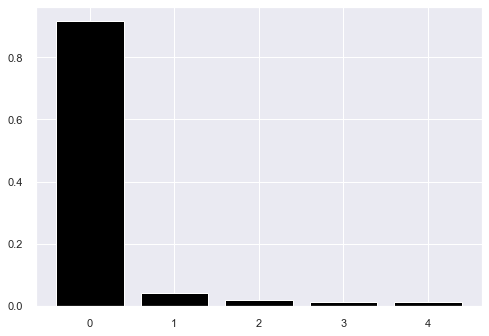

In [18]:
pca = PCA(n_components = X.shape[1])
principal_components = pca.fit_transform(X)

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black' )

# pca component
df_pca = pd.DataFrame( principal_components )

<AxesSubplot:xlabel='0', ylabel='1'>

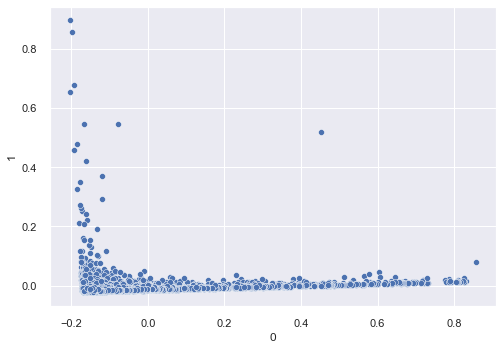

In [19]:
sns.scatterplot(x = 0, y = 1, data = df_pca)


### 1.3.2 Umap

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

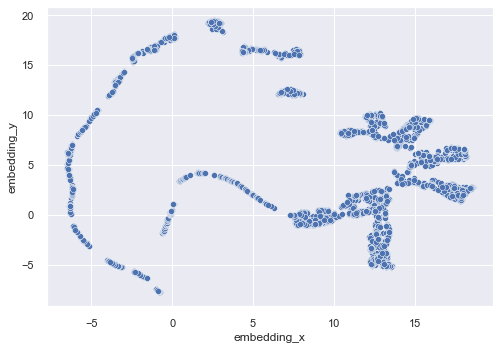

In [20]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

### 1.3.3 TSNE

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

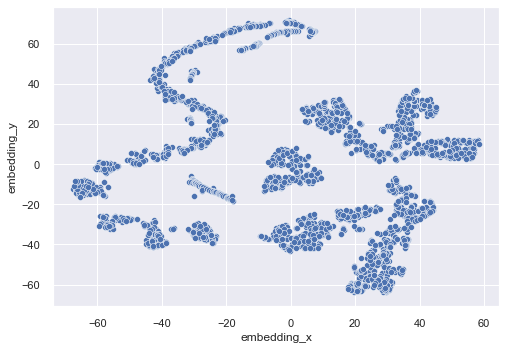

In [21]:
reducer = TSNE(n_components = 2,
                    n_jobs = -1,
                    random_state=42 )

embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

### 1.3.4 Tree-based Embedding

In [22]:
X = df[cols_selected].drop(columns = 'gross_revenue')
y = df.gross_revenue

In [23]:
# model definition
rf = RandomForestRegressor(random_state=42 )

# model training
rf.fit( X, y )


# Leaf df
df_leaf = pd.DataFrame(rf.apply(X))


In [24]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,3466,3441,3727,3676,3656,3752,3616,3688,3685,3493,...,3450,3392,3423,3680,3588,3706,3670,3406,3627,3653
1,3339,3399,3597,3056,3024,2971,3155,3518,3316,3246,...,2810,3270,3059,2943,3404,2996,2976,3304,3025,3509
2,3513,2984,3627,3580,3555,3651,3282,3551,3332,3332,...,3420,3341,3479,3530,3526,3595,3044,3381,3539,3584
3,1085,543,1212,309,854,345,537,933,1295,1233,...,538,1545,576,600,1057,1308,568,523,924,891
4,437,631,377,889,911,778,1020,37,562,485,...,895,612,877,700,764,468,689,882,1316,461


<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

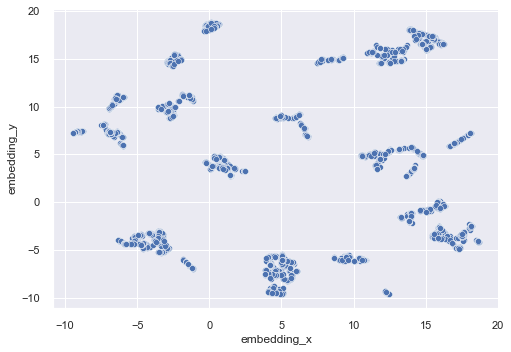

In [25]:
# Reduce dimensionality
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_tree = pd.DataFrame()
df_tree['embedding_x'] = embedding[:, 0]
df_tree['embedding_y'] = embedding[:, 1]

# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_tree )

# 2.0 Data Prep

#sns.set()
#mm = MinMaxScaler()
#model_df = df.drop(columns = 'customer_id')

#sns.set(rc={'figure.figsize':(20,20)}, style = 'white')
plt.figure( figsize=(20, 20) )

for i, column in enumerate(model_df.columns, 1):
    try:
        plt.subplot(5,2,i)
        sns.histplot(model_df[column]).set(ylabel = None)
        sns.despine(left=True)
    except:
        pass

Given that none of the features had a clear normal distribution and had outliers, I'll be using the min max scaler to rescale the variables.

sns.set()
for col in model_df.columns:
    model_df[col] = mm.fit_transform(model_df[[col]])

# 3.0 Feature Selection

In [26]:
# removing avgs cols
cols_selected = ['gross_revenue', 'last_purchase', 'qt_products', 'frequency', 'qt_returns']

# 4.0 Hyperparameter Fine-Tunning

In [27]:
X = df_tree.copy()

clusters = np.arange( 2, 25, 1)

## 4.1 Kmeans

In [28]:
kmeans_list = []

for k in clusters:
    # model definition
    kmeans = KMeans( n_clusters= k )

    # model training
    kmeans.fit( X )

    # model predict
    labels = kmeans.predict( X )

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    kmeans_list.append( sil )

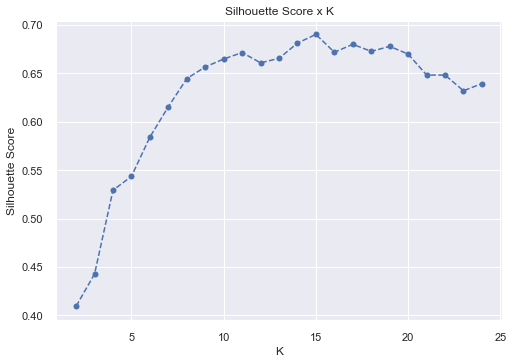

In [29]:
plt.plot( clusters, kmeans_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.2 GMM 

In [30]:
gmm_list = []

for k in clusters:
    # model definition
    gmm = GaussianMixture(n_components = k)

    # model training 
    gmm.fit(X)

    # model predict
    labels = gmm.predict(X)

    # model performance
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    gmm_list.append( sil )

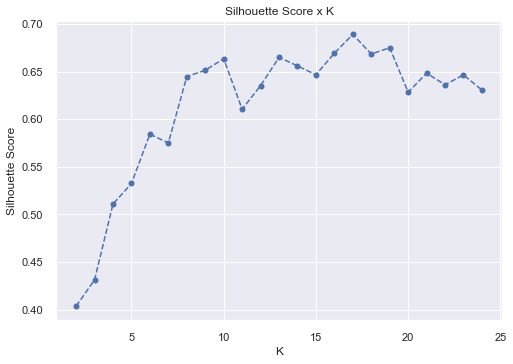

In [31]:
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

## 4.3 Hierarchical Clustering

In [32]:
# model definition and training 
hc = linkage(X, 'ward')

[]

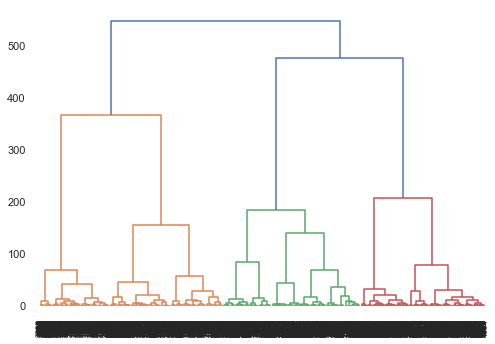

In [33]:
dendrogram(hc,
         leaf_rotation = 90,
         leaf_font_size = 8
         )

plt.plot()

[]

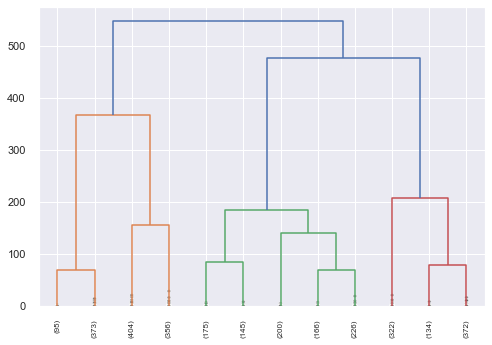

In [34]:
dendrogram(hc,
         truncate_mode = 'lastp',
         p = 12,
         leaf_rotation = 90,
         leaf_font_size = 8,
         show_contracted = True
          )

plt.plot()

### 4.3.1 HClustering Silhouette Score

In [35]:
hc_list = []
for k in clusters:

    # model training & definition
    hc = linkage(X, 'ward')

    # prediction 
    labels = fcluster( hc, k, criterion = 'maxclust' )

    # metrics
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append(sil)

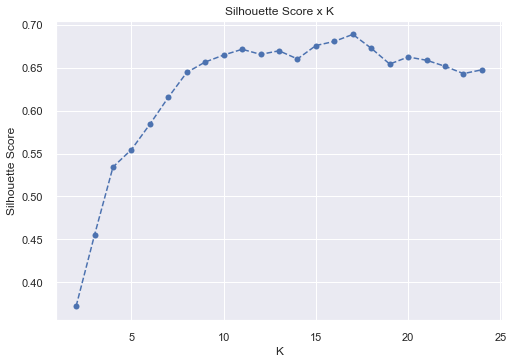

In [36]:
plt.plot( clusters, hc_list, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score x K' );

### 4.3.2 Silhouette Analysis

fig, ax = plt.subplots( 3, 2 )
fig.set_size_inches( 25, 20 )

for k in clusters:
    q, mod = divmod( k, 2 )
    
    ax[q-1, mod].set_xlim( [ -0.1, 1] )
    ax[q-1, mod].set_ylim( [ 0, len( X ) + ( k+1 )*10] )
    
    # model definition & training
    hc_model = linkage( X, 'ward' )

    # model predict
    labels = fcluster( hc_model, k, criterion='maxclust' )

    # performance
    ss = metrics.silhouette_score( X, labels, metric='euclidean' )
    print( ' For K = {}. Silhouette Score: {}'.format( k, ss ) )

    samples_silhouette_values = metrics.silhouette_samples( X, labels )

    y_lower = 10
    for i in range( k ):

        # select clusters
        ith_samples_silhouette_values = samples_silhouette_values[ labels == i]
        
        # sort values
        ith_samples_silhouette_values.sort()

        # size clusters
        size_cluster_i = ith_samples_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        cmap = cm.get_cmap( 'Spectral' )
        color = cmap( i / k )

        ax[q-1, mod].fill_betweenx( np.arange( y_lower, y_upper ), 0, ith_samples_silhouette_values  )
        
        y_lower = y_upper + 10
        
    ax[q-1, mod].set_yticks([])
    ax[q-1, mod].set_xticks( [-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

## 4.4 DBSCAN

In [38]:
eps = 2
min_samples = 20

# model defintion
db_scan = DBSCAN(eps = eps, min_samples = min_samples)

# model training
labels = db_scan.fit_predict(X)

sil = metrics.silhouette_score(X, labels, metric = 'euclidean')
print( 'Silhouette Score: {}'.format( sil ) )
print( 'Number of Clusters: {}'.format( len( np.unique( labels ) ) ) )
print( np.unique( labels ) )

Silhouette Score: 0.6914728879928589
Number of Clusters: 14
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]


In [39]:
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13],
      dtype=int64)

In [40]:
neighbors = NearestNeighbors( n_neighbors = min_samples ).fit(X)
distances, index = neighbors.kneighbors(X)

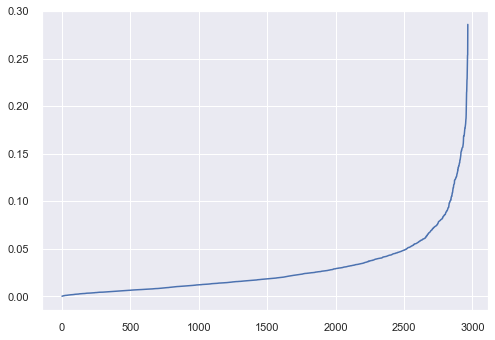

In [41]:
distances = np.sort(distances, axis = 0)[:,1]
plt.plot(distances)

## 4.5 Results

In [42]:
results = pd.DataFrame(
        {'Kmeans': kmeans_list,
        'Gmm': gmm_list,
        'HC': hc_list}
).T

results.columns = clusters

In [43]:
results.style.highlight_max(color = 'lightgreen', axis = 1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
Kmeans,0.409454,0.442797,0.529373,0.543624,0.584267,0.615624,0.644686,0.656771,0.664942,0.671635,0.660986,0.665620,0.681397,0.690364,0.671968,0.680097,0.672864,0.678001,0.670003,0.648417,0.648324,0.632131,0.639554
Gmm,0.403487,0.431200,0.510826,0.532375,0.584267,0.574867,0.644686,0.651309,0.663464,0.610386,0.635162,0.664908,0.655893,0.646607,0.669246,0.688969,0.668368,0.674999,0.628225,0.648280,0.636088,0.646452,0.630487
HC,0.372074,0.455208,0.534358,0.554676,0.584267,0.615624,0.644686,0.656771,0.664942,0.671635,0.665690,0.669862,0.660379,0.675986,0.680839,0.688969,0.672822,0.654406,0.662637,0.658839,0.651785,0.643250,0.647747


# 5.0 Model Training

## 5.1 Final model

In [44]:
k = 8

 ## model definition
gm = GaussianMixture( n_components=k )

# model training
gm.fit( X )

# model predict
labels = gm.predict( X )


## 5.2 Cluster validation

In [45]:
## SS ( Silhouette Score )
print( f'''SS value: {metrics.silhouette_score( X, labels, metric='euclidean') }''')

SS value: 0.6446863412857056


# 6.0 Cluster Analysis

## 6.1 Visualization Inspection

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

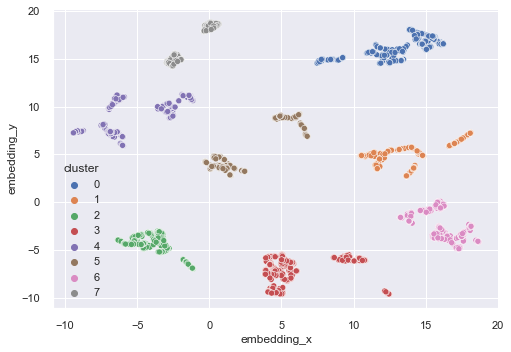

In [46]:
df_viz = X.copy()
df_viz['cluster'] = labels
sns.scatterplot( x='embedding_x', y='embedding_y', hue='cluster', data=df_viz, palette='deep')

# 7.0 Cluster Profile

In [47]:
df = df[ ['customer_id'] + cols_selected]
df['cluster'] = labels
df.head()

,customer_id,gross_revenue,last_purchase,qt_products,frequency,qt_returns,cluster
0,17850,5391.21,372.0,297.0,17.000000,40.0,0
1,13047,3232.59,56.0,171.0,0.028302,35.0,5
2,12583,6705.38,2.0,232.0,0.040323,50.0,0
3,13748,948.25,95.0,28.0,0.017921,0.0,5
4,15100,876.00,333.0,3.0,0.073171,22.0,4


In [48]:
## Cluster Profile

description = df.groupby("cluster")
n_clients = description.size()
description = description.mean()
description['n_clients'] = n_clients
description['n_clients_perc'] = n_clients/n_clients.sum()*100 
description = description.drop(columns = 'customer_id')

description.sort_values('gross_revenue', ascending = False).round(2)

,gross_revenue,last_purchase,qt_products,frequency,qt_returns,n_clients,n_clients_perc
cluster,,,,,,,
0,8836.14,21.44,424.13,0.09,149.27,468,15.77
1,2404.84,43.60,128.37,0.04,19.90,356,11.99
3,2127.02,58.88,66.75,0.05,16.89,506,17.05
5,1886.33,65.92,93.46,0.12,23.15,320,10.78
6,1689.18,54.80,89.20,0.05,11.54,404,13.61
2,971.03,75.33,37.46,0.07,6.57,322,10.85
7,647.93,47.28,11.51,0.03,0.84,200,6.74
4,505.73,149.43,15.52,0.43,9.44,392,13.21


- 0 Cluster Insiders
- 5 Cluster More Products
- 4 Cluster Spend Money 
- 2 Cluster Even More Products
- 6 Cluster Less Days
- 0 Cluster Less 1k
- 7 Cluster Stop Returners
- 3 Cluster More Buy

In [74]:
insiders = 0

# 7.0 Clusters EDA

## 7.1 Hypothesis Mindmap

![Hypothesis Mindmap](hypothesis_mindmap.png)

## 7.2 Business Hypothesis

### 7.2.1 Purchase Hypothesis

1. Customers in the insiders cluster use credit cards for 80% of purchases.
2. Customers in the insiders cluster have an average ticket 10% greater than More Products cluster.
3. Insiders cluster customers have a basket size above 5 products.
4. **Customers in the insiders cluster represent more than 10% of the purchases volume (products).**
5. **Customers in the insiders cluster represent more than 10% of the purchases volume (invoicing).**
6. **Insiders cluster customers have an average return amount below the average of the total return amount.**
7. **The median of saless in the insider cluster is 10% higher than the median of overall sales.**
8. **The percentile of gmv by insider customers.**


### H1: Customers in the insiders cluster represent more than 10% of the purchases volume (products).
**True. The insiders cluster represent approximately 54% of the purchases volume (products).**

In [63]:
clusters = df.groupby(['cluster']).agg({'qt_products': 'sum'})
clusters = clusters.apply(lambda x: 100 * x / float(x.sum()))
clusters

,qt_products
cluster,
0,54.476967
1,12.542643
2,3.310691
3,9.269551
4,1.670029
5,8.207704
6,9.890632
7,0.631784


### H2: Customers in the insiders cluster represent more than 10% of the purchases volume (invoicing).
**True. The insiders cluster represent approximately 52% of the purchases volume (invoicing).**

In [65]:
clusters = df.groupby(['cluster']).agg({'gross_revenue': 'sum'})
clusters = clusters.apply(lambda x: 100 * x / float(x.sum()))
clusters

,gross_revenue
cluster,
0,51.728489
1,10.709198
2,3.911182
3,13.463061
4,2.479849
5,7.550732
6,8.536492
7,1.620996


### H3: Insiders cluster customers have an average return amount below the average of the total return amount.
**False. The insiders cluster has an avg return amount of 149.27, while the avg. total return amount is 34.89**

In [84]:
insiders_return = df[df.cluster == insiders].qt_returns.mean()
returns_avg = df.qt_returns.mean()
print(f"Insiders avg return amount: {round(insiders_return, 2)}, avg return total amount: {round(returns_avg, 2)}")

Insiders avg return amount: 149.27, avg return total amount: 34.89


### 7.2.2 Clients Hypothesis

1. 60% of the clients in the insiders cluster have the marital status of single.
2. 10% of the clients in the insiders cluster are between the ages of 24-35.
3. 40% of the delivery locations in the insiders cluster are within a 50km radius.
4. 5% of the clients in the insiders cluster receive more than $100,000 annually.
5. 90% of the clients in the insiders cluster have completed higher education.

### 7.2.3 Product Hypothesis

1. 30% of all products in large packages are purchased by the insiders cluster.
2. The median price of products purchased by customers in the insider cluster is 10% higher than the median of all product prices.
3. The percentile of the price of products purchased by insider customers.
4. The average weight of products purchased by customers in the insiders cluster is greater than the average weight of the other clusters.
5. The average age of products purchased by customers in the insiders cluster is less than 15 days.